In [3]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import celltypist

In [4]:
import session_info
session_info.show()

In [5]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [6]:
sc.settings.set_figure_params(dpi=80)

# Variables

In [7]:
adata_dir = '/lustre/scratch126/cellgen/team205/kk18/VisiumHD/objects/subsets'
sample_id = 'HEA_FOET14880396'
celltype = 'MyeloidCells'

In [8]:
figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk/Aug2024'
table_dir = '/nfs/team205/heart/fetal_ms_figures/tables/Aug2024'

# Read in data

In [9]:
# read in
adata = sc.read_h5ad(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
adata

AnnData object with n_obs × n_vars = 526 × 13502
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2', 'fine_grain_manual', 'leiden_0.5'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coar

# Remove mid-grain markers from the feature

In [10]:
# read in
midgrain_markers = pd.read_csv('/nfs/team205/kk18/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_midgrain_markers.csv',
                               index_col=0
                              )
# remove the markers of celltype of interest
midgrain_markers = midgrain_markers[midgrain_markers['group']!=celltype]
midgrain_markers.head()

,group,names,scores,logfoldchanges,pvals,pvals_adj,group_mean
0,AtrialCardiomyocytes,MYH6,589.18000,8.461190,0.0,0.0,3.555969
1,AtrialCardiomyocytes,PAM,446.76710,5.372062,0.0,0.0,4.026159
2,AtrialCardiomyocytes,NPPA,444.35940,7.048445,0.0,0.0,4.366144
3,AtrialCardiomyocytes,MYL7,444.03253,5.999820,0.0,0.0,4.489749
4,AtrialCardiomyocytes,TNNT2,428.84238,4.739163,0.0,0.0,3.264460


In [11]:
'GATA2' in list(midgrain_markers['names'])

False

In [12]:
# remove
mask = [x not in list(midgrain_markers['names']) for x in adata.var_names]
bdata = adata[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 526 × 12303
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2', 'fine_grain_manual', 'leiden_0.5'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltyp

In [13]:
# remove cell cycle genes
cell_cycle_genes = ['MCM5','PCNA','TYMS','FEN1','MCM2','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1','UHRF1','MLF1IP','HELLS','RFC2','RPA2','NASP',
                'RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7','POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
                'USP1','CLSPN','POLA1','CHAF1B','BRIP1','E2F8','HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B','MKI67',
                'TMPO','CENPF','TACC3','FAM64A','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1','KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','HN1',
                'CDC20','TTK','CDC25C','KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1','ANLN','LBR','CKAP5','CENPE','CTCF',
                'NEK2','G2E3','GAS2L3','CBX5','CENPA']
mask = [x not in cell_cycle_genes for x in bdata.var_names]
bdata = bdata[:,mask]
bdata.shape

(526, 12209)

In [14]:
'MYH11' in list(bdata.var_names)

False

# PCA, Clustering, UMAP

number of hvgs: 2881


/software/cellgen/team205/kk18/envs/generic_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


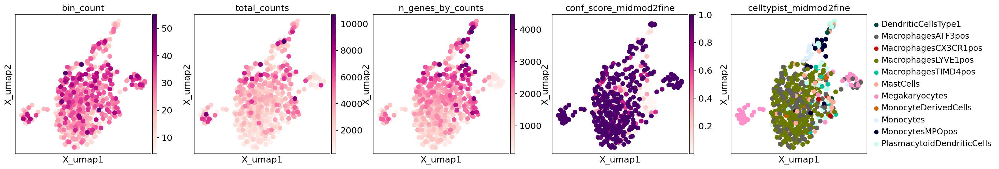

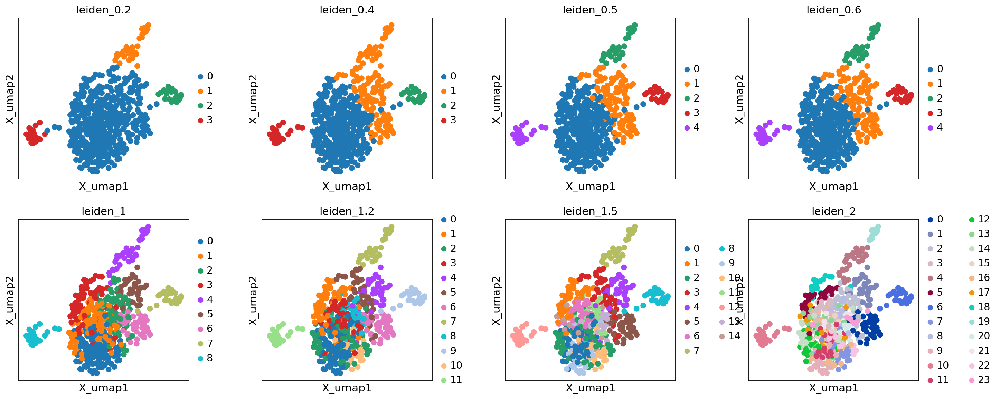

In [15]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
adata.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(adata,n_neighbors=15,use_rep='X_pca')
# visualisation with umap
sc.tl.umap(adata,min_dist=0.5)
sc.pl.embedding(adata,basis='X_umap',color=['bin_count','total_counts','n_genes_by_counts',"conf_score_midmod2fine","celltypist_midmod2fine",],
                wspace=0.2,cmap='RdPu',vmax='p100',ncols=5)
# leiden clustering
resolutions_list = [0.2,0.4,0.5,0.6,1,1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata,resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata,basis='X_umap',
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

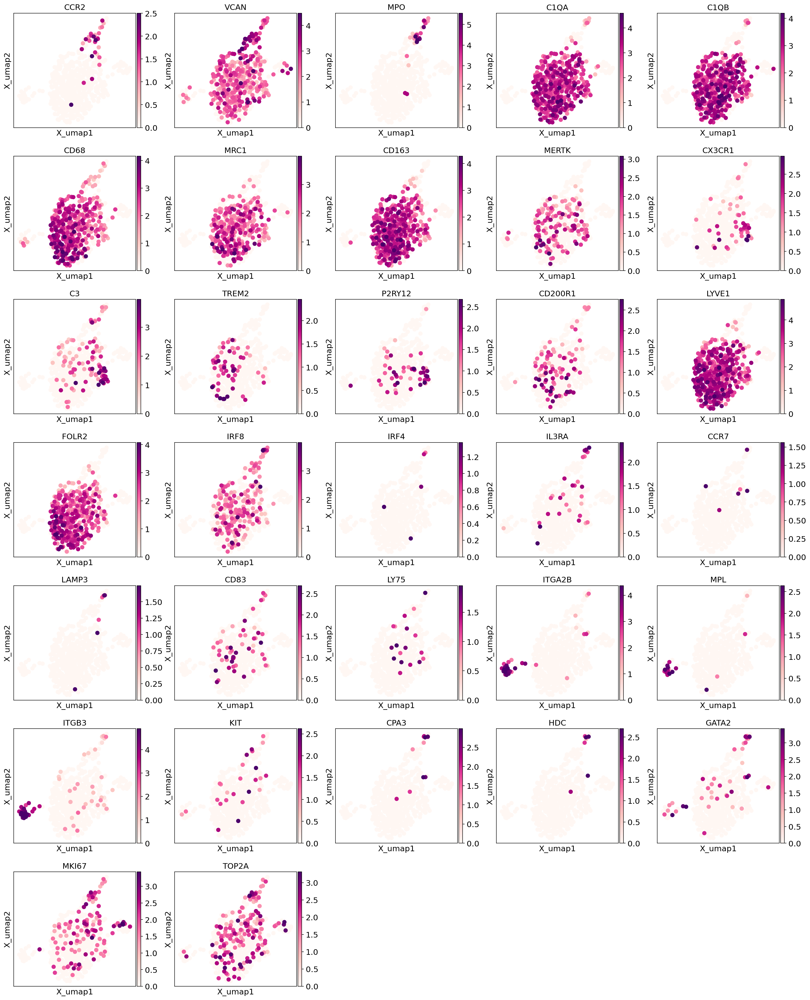

In [16]:
markers={
    'Mono':['CCR2','FCN1','VCAN','MPO'],
    'MP':['C1QA','C1QB','CD68','MRC1','CD163','MERTK'],
    'CX3CR1+':['CX3CR1','C3','TREM2','P2RY12','CD200R1'],
    'LYVE1+':['LYVE1','FOLR2'],
     'pDC':['IRF8','IRF4','IL3RA'],
     'DC_mature':['FLT3', 'CCR7','LAMP3', 'IL15', 'CD83', 'LY75', ],
    'Megakaryocyte':['ITGA2B','MPL','ITGB3',],
    'Mast': ['KIT', 'CPA3','HDC','GATA2'],
    'Cycling':['MKI67','TOP2A'],
}
genes = []
for g in markers.values():
    genes = genes + [x for x in g if (x in adata.var_names)&(x not in genes)]
sc.pl.embedding(adata,basis='X_umap',color=genes,
               ncols=5, wspace=0.2,cmap='RdPu',vmax='p99.7')

In [17]:
resolution_sel = 0.6

categories: 0, 1, 2, etc.
var_group_labels: CM, FB, EC, etc.


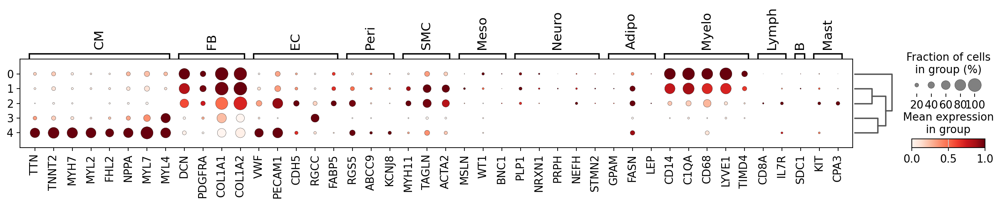

In [18]:
markers = {
    'CM': ['TTN', 'TNNT2','MYH6',
        'MYH7', 'MYL2', 'FHL2', # vCN
            'NPPA', 'MYL7', 'MYL4'], #aCM
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5',],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              markers, 
              groupby=f'leiden_{str(resolution_sel)}',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

categories: 0, 1, 2, etc.
var_group_labels: Mono, MP, CX3CR1+, etc.


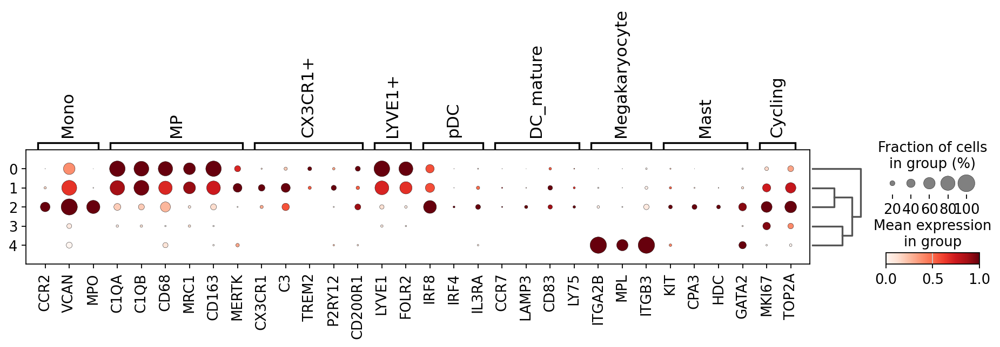

In [19]:
markers={
    'Mono':['CCR2','FCN1','VCAN','MPO'],
    'MP':['C1QA','C1QB','CD68','MRC1','CD163','MERTK'],
    'CX3CR1+':['CX3CR1','C3','TREM2','P2RY12','CD200R1'],
    'LYVE1+':['LYVE1','FOLR2'],
     'pDC':['IRF8','IRF4','IL3RA'],
     'DC_mature':['FLT3', 'CCR7','LAMP3', 'IL15', 'CD83', 'LY75', ],
    'Megakaryocyte':['ITGA2B','MPL','ITGB3',],
    'Mast': ['KIT', 'CPA3','HDC','GATA2'],
    'Cycling':['MKI67','TOP2A'],
}
genes = []
markers_sel = {}
for k,g in markers.items():
    markers_sel[k] = [x for x in g if x in adata.var_names]
    genes = genes + [x for x in g if (x in adata.var_names)&(x not in genes)]
    
sc.tl.dendrogram(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              var_names=markers_sel,
              groupby=f'leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[1.41297585 1.03895088 1.42284238 1.5805253  1.88093143]


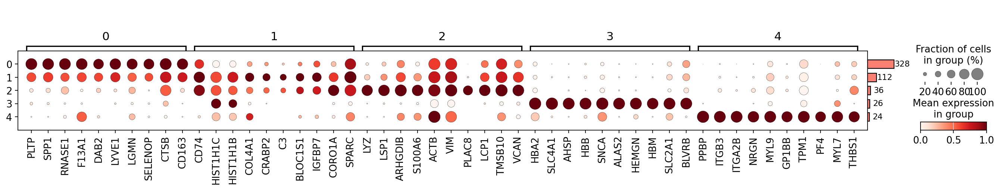

In [20]:
# DEG analysis
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

[1.41297585 1.03895088 1.42284238 1.5805253  1.88093143]


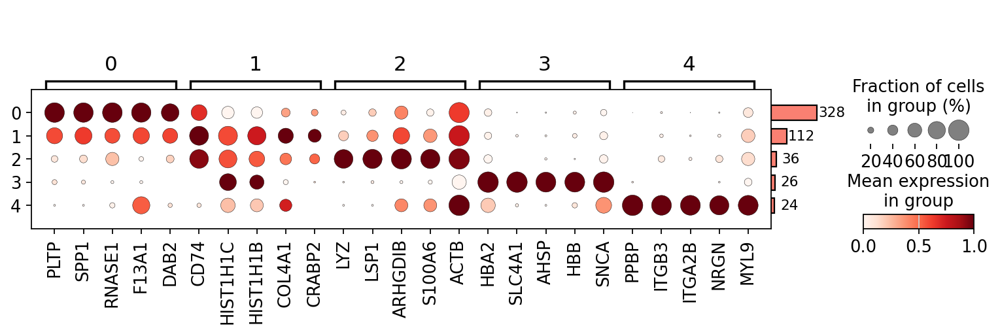

In [21]:
# DEG analysis
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True, n_genes=5)
dp.add_totals().show()

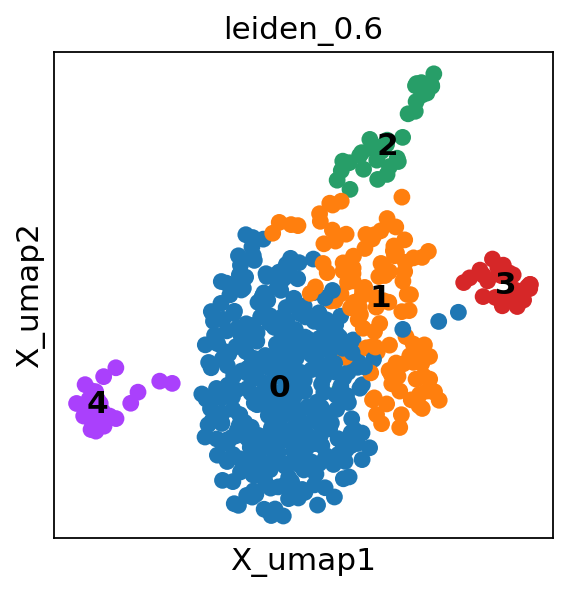

In [22]:
sc.pl.embedding(adata,basis='X_umap',
                color=f'leiden_{str(resolution_sel)}',
                wspace=0.3, legend_loc='on data')

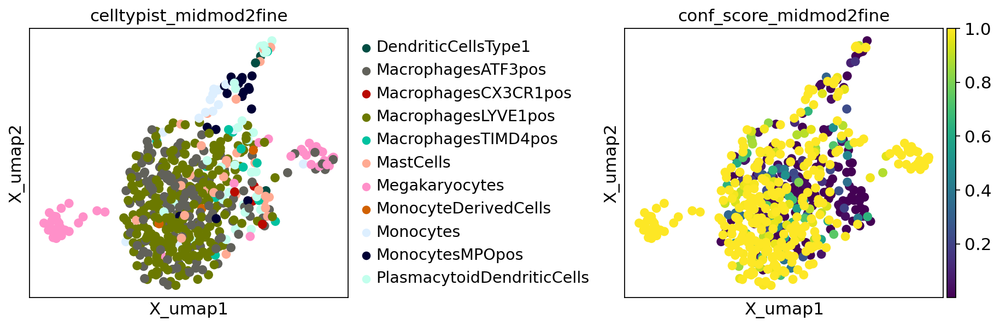

In [23]:
sc.pl.embedding(adata,basis='X_umap',
                color=['celltypist_midmod2fine', 'conf_score_midmod2fine'],
                wspace=0.7)

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

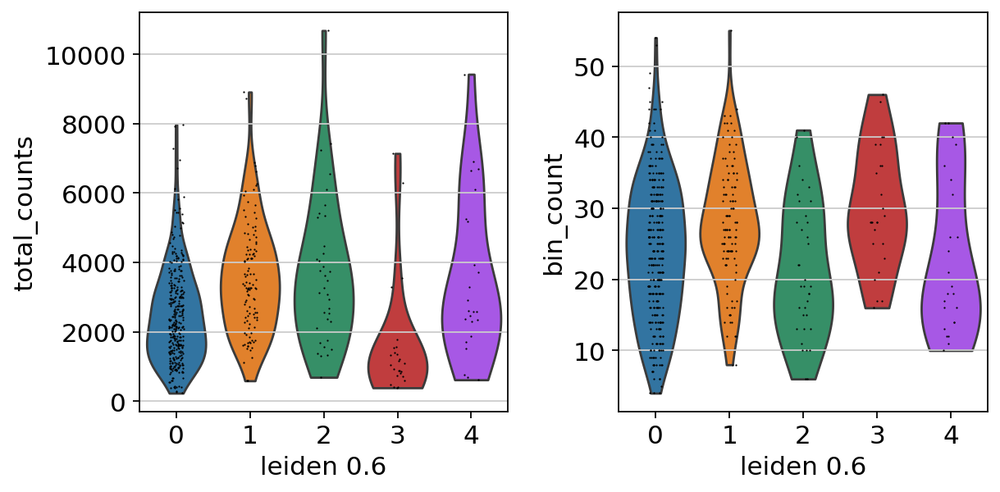

In [24]:
sc.pl.violin(adata,keys=['total_counts','bin_count'],groupby=f'leiden_{str(resolution_sel)}')

In [25]:
# annotate
adata.obs['fine_grain_manual'] = adata.obs[f'leiden_{str(resolution_sel)}'].copy()
adata.obs.replace({'fine_grain_manual':{
    '0':'Macrophages',
    '1':'Macrophages',
    '2':'Monocytes',
    '3':'Erythrocytes',
    '4':'Megakaryocytes',
}},inplace=True)
adata.obs['fine_grain_manual'].value_counts()

fine_grain_manual
Macrophages       440
Monocytes          36
Erythrocytes       26
Megakaryocytes     24
Name: count, dtype: int64

In [26]:
ad = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/Feb28ObjectRaw_finegrain_updated.h5ad',backed='r')
set(ad.obs['fine_grain'])

{'AtrialCardiomyocytesCycling',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
 'AtrioventricularNodePacemakerCells',
 'BCells',
 'BCellsMS4A1pos',
 'ChromaffinCells',
 'CoronaryArterialEndothelialCells',
 'CoronaryCapillaryEndothelialCells',
 'CoronaryPericytes',
 'CoronarySmoothMuscleCells',
 'CoronaryVenousEndothelialCells',
 'CoronaryVesselAdventitialFibroblasts',
 'DendriticCellsMature',
 'DendriticCellsType1',
 'DuctusArteriosusSmoothMuscleCells',
 'EndocardialCells',
 'EndocardialCushionCells',
 'EpicardiumDerivedCells',
 'GreatVesselAdventitialFibroblasts',
 'GreatVesselArterialEndothelialCells',
 'GreatVesselSmoothMuscleCells',
 'GreatVesselVenousEndothelialCells',
 'InnateLymphoidCells',
 'LymphNodeFibroblasticReticularCells',
 'LymphaticEndothelialCells',
 'MacrophagesATF3pos',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
 'MacrophagesTIMD4pos',
 'MastCells',
 'Megakaryocytes',
 'MesothelialEpicardialCells',
 'MonocyteDerivedCells',
 'Monocytes',
 'MonocytesM

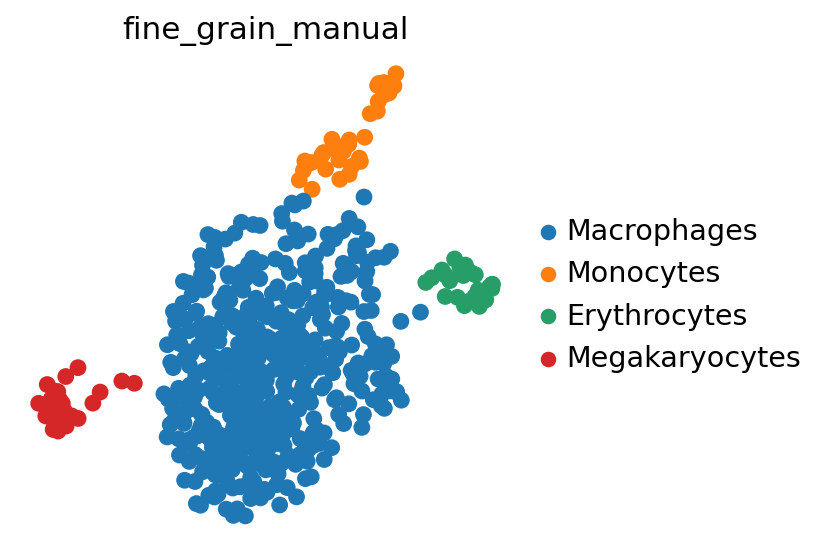

In [27]:
sc.pl.embedding(adata,basis='X_umap',
                color='fine_grain_manual',
                frameon=False,
                wspace=0.3)

categories: Macrophages, Monocytes, Erythrocytes, etc.
var_group_labels: Mono, MP, CX3CR1+, etc.


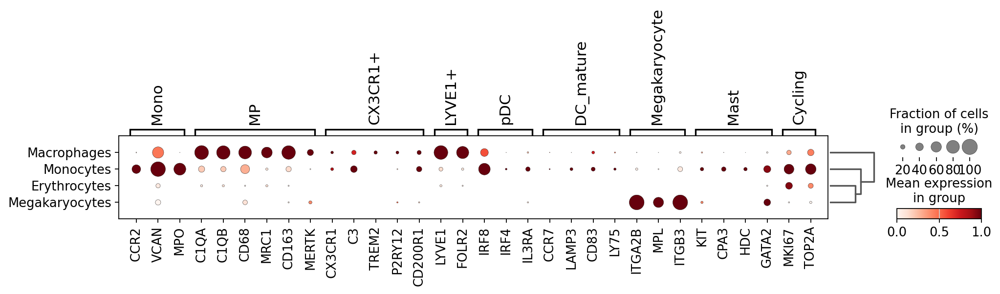

In [28]:
markers={
    'Mono':['CCR2','FCN1','VCAN','MPO'],
    'MP':['C1QA','C1QB','CD68','MRC1','CD163','MERTK'],
    'CX3CR1+':['CX3CR1','C3','TREM2','P2RY12','CD200R1'],
    'LYVE1+':['LYVE1','FOLR2'],
     'pDC':['IRF8','IRF4','IL3RA'],
     'DC_mature':['FLT3', 'CCR7','LAMP3', 'IL15', 'CD83', 'LY75', ],
    'Megakaryocyte':['ITGA2B','MPL','ITGB3',],
    'Mast': ['KIT', 'CPA3','HDC','GATA2'],
    'Cycling':['MKI67','TOP2A'],
}
genes = []
markers_sel = {}
for k,g in markers.items():
    markers_sel[k] = [x for x in g if x in adata.var_names]
    genes = genes + [x for x in g if (x in adata.var_names)&(x not in genes)]

sc.tl.dendrogram(adata,groupby='fine_grain_manual')
sc.pl.dotplot(adata,
              var_names=markers_sel,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

# Subset and reclustering

In [29]:
adata_sub = adata[adata.obs['fine_grain_manual'].isin(['Monocytes','Macrophages'])]
adata_sub.obs['fine_grain_manual'].value_counts()

fine_grain_manual
Macrophages    440
Monocytes       36
Name: count, dtype: int64

In [30]:
# drop leiden clustering results
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    adata_sub.obs.drop(f'leiden_{str(resolution)}',axis=1,inplace=True)
adata_sub

AnnData object with n_obs × n_vars = 476 × 13502
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_manual', 'leiden_0.5'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coarse_colors', 'celltypist_coarse_fin_colors', 'celltypist_mid

In [31]:
## Remove mid-grain markers from the feature
# read in markers
midgrain_markers = pd.read_csv('/nfs/team205/kk18/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_midgrain_markers.csv',
                               index_col=0)
# remove the markers of celltype of interest
midgrain_markers = midgrain_markers[midgrain_markers['group']!=celltype]
# remove
mask = [x not in list(midgrain_markers['names']) for x in adata_sub.var_names]
bdata = adata_sub[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 476 × 12303
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_manual', 'leiden_0.5'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coarse_colors', 'celltypist_coarse_fin_colors', 'cellty

In [32]:
# remove cell cycle genes
cell_cycle_genes = ['MCM5','PCNA','TYMS','FEN1','MCM2','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1','UHRF1','MLF1IP','HELLS','RFC2','RPA2','NASP',
                'RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7','POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
                'USP1','CLSPN','POLA1','CHAF1B','BRIP1','E2F8','HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B','MKI67',
                'TMPO','CENPF','TACC3','FAM64A','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1','KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','HN1',
                'CDC20','TTK','CDC25C','KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1','ANLN','LBR','CKAP5','CENPE','CTCF',
                'NEK2','G2E3','GAS2L3','CBX5','CENPA']
mask = [x not in cell_cycle_genes for x in bdata.var_names]
bdata = bdata[:,mask]
bdata.shape

(476, 12209)

number of hvgs: 2992


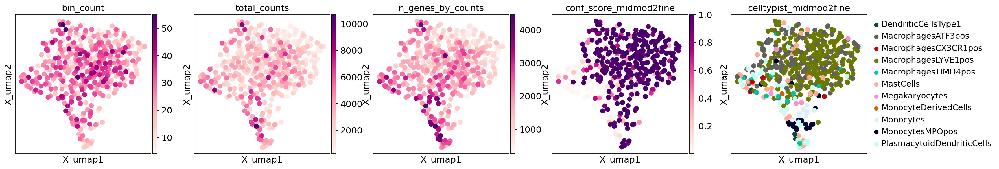

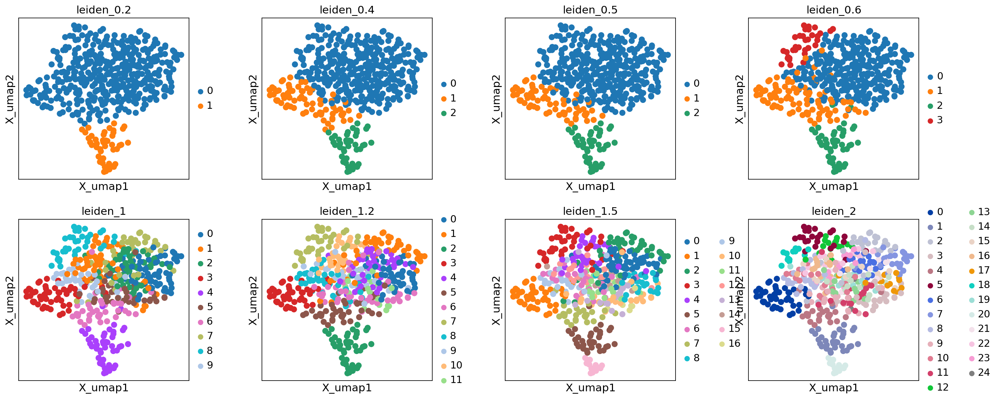

In [33]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
adata_sub.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(adata_sub,n_neighbors=15,use_rep='X_pca')
# visualisation with umap
sc.tl.umap(adata_sub,min_dist=0.5)
sc.pl.embedding(adata_sub,basis='X_umap',color=['bin_count','total_counts','n_genes_by_counts',"conf_score_midmod2fine","celltypist_midmod2fine",],
                wspace=0.2,cmap='RdPu',vmax='p100',ncols=5)
# leiden clustering
resolutions_list = [0.2,0.4,0.5,0.6,1,1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata_sub,resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata_sub,basis='X_umap',
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

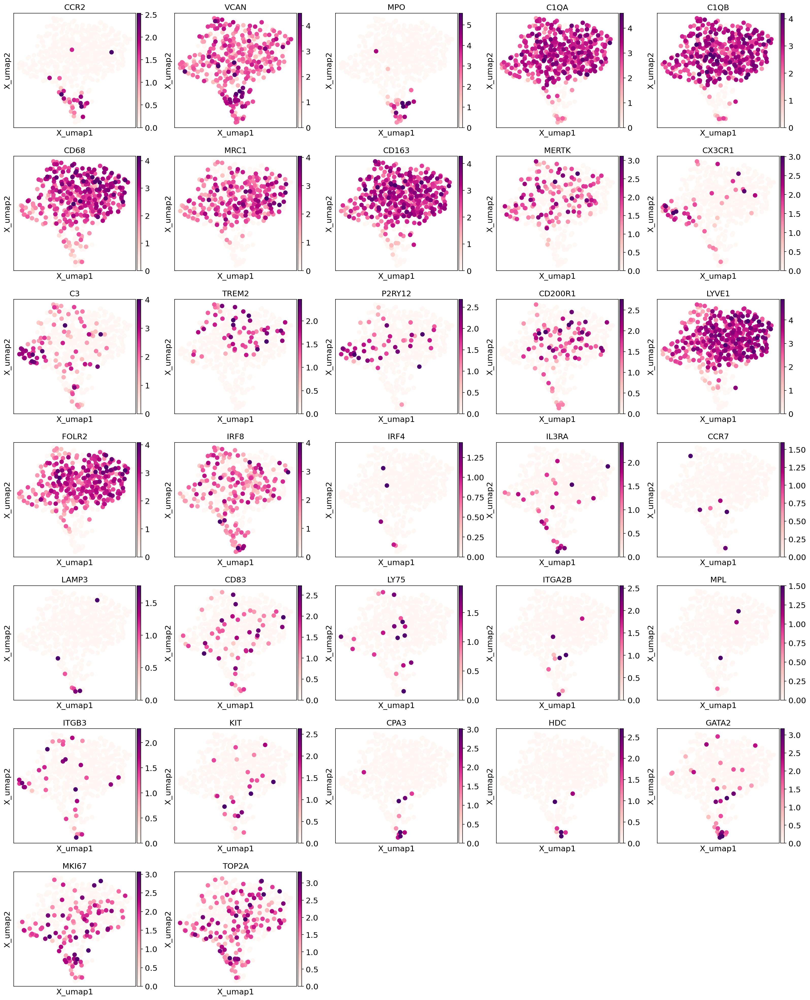

In [34]:
markers={
    'Mono':['CCR2','FCN1','VCAN','MPO'],
    'MP':['C1QA','C1QB','CD68','MRC1','CD163','MERTK'],
    'CX3CR1+':['CX3CR1','C3','TREM2','P2RY12','CD200R1'],
    'LYVE1+':['LYVE1','FOLR2'],
     'pDC':['IRF8','IRF4','IL3RA'],
     'DC_mature':['FLT3', 'CCR7','LAMP3', 'IL15', 'CD83', 'LY75', ],
    'Megakaryocyte':['ITGA2B','MPL','ITGB3',],
    'Mast': ['KIT', 'CPA3','HDC','GATA2'],
    'Cycling':['MKI67','TOP2A'],
}
genes = []
for g in markers.values():
    genes = genes + [x for x in g if (x in adata_sub.var_names)&(x not in genes)]
sc.pl.embedding(adata_sub,basis='X_umap',color=genes,
               ncols=5, wspace=0.2,cmap='RdPu',vmax='p99.7')

In [61]:
sub_resolution_sel = 1

categories: 0, 1, 2, etc.
var_group_labels: Mono, MP, CX3CR1+, etc.


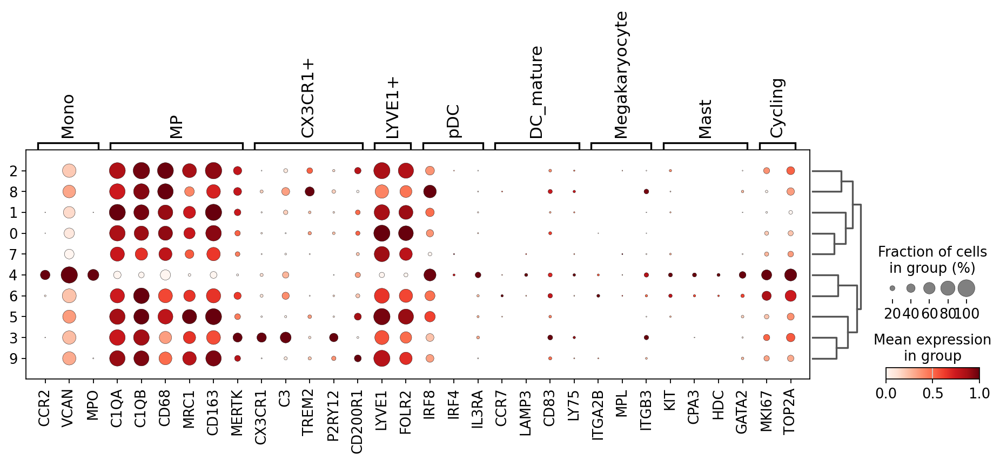

In [62]:
sc.tl.dendrogram(adata_sub,groupby=f'leiden_{str(sub_resolution_sel)}')
sc.pl.dotplot(adata_sub,
              var_names=markers_sel,
              groupby=f'leiden_{str(sub_resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[1.41297585 1.03895088 1.42284238 1.5805253  1.88093143]


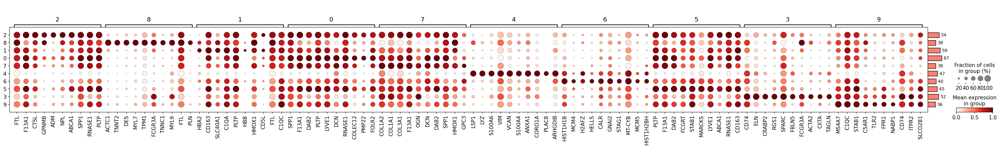

In [37]:
# DEG analysis
print(adata_sub.X.data[:5])
adata_sub.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata_sub,groupby=f'leiden_{str(sub_resolution_sel)}')
sc.tl.dendrogram(adata_sub, groupby=f'leiden_{str(sub_resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata_sub, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

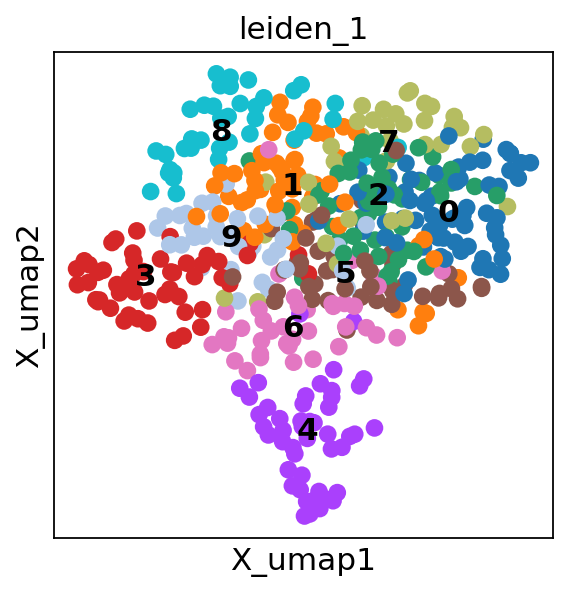

In [38]:
sc.pl.embedding(adata_sub,basis='X_umap',
                color=f'leiden_{str(sub_resolution_sel)}',
                wspace=0.3, legend_loc='on data')

In [70]:
# calculate CX3CR1/LYVE1 expression ratio
# to annotate MacrophagesCX3CR1pos
df = adata_sub.to_df()[['CX3CR1','LYVE1']].copy()
df[f'leiden_{str(sub_resolution_sel)}'] = adata_sub.obs[f'leiden_{str(sub_resolution_sel)}']
df = df.groupby(f'leiden_{str(sub_resolution_sel)}').mean()
df['CX3CR1-to-LYVE1'] = df['CX3CR1']/df['LYVE1']
df.sort_values('CX3CR1-to-LYVE1',ascending=False)

,CX3CR1,LYVE1,CX3CR1-to-LYVE1
leiden_1,,,
3,0.859512,2.118904,0.405640
4,0.124051,0.426406,0.290923
8,0.173378,1.700853,0.101936
6,0.110355,2.393309,0.046110
0,0.099557,3.454640,0.028818
7,0.073248,3.106507,0.023579
1,0.055415,3.044395,0.018202
5,0.042689,3.349317,0.012746
9,0.031578,2.896380,0.010902


--> cluster 3 and 8 are MacrophagesCX3CR1pos (cluster 4 is likely to be monocytes)

In [71]:
# annotate
adata_sub.obs['fine_grain_manual'] = adata_sub.obs[f'leiden_{str(sub_resolution_sel)}'].copy()
adata_sub.obs.replace({'fine_grain_manual':{
    '0':'MacrophagesLYVE1pos',
    '1':'MacrophagesLYVE1pos',
    '2':'MacrophagesLYVE1pos',
    '3':'MacrophagesCX3CR1pos',
    '4':'Monocytes',
    '5':'MacrophagesLYVE1pos',
    '6':'MonocyteDerivedCells',
     '7':'MacrophagesLYVE1pos',
     '8':'MacrophagesCX3CR1pos',
    '9':'MacrophagesLYVE1pos',
}},inplace=True)
adata_sub.obs['fine_grain_manual'].value_counts()

fine_grain_manual
MacrophagesLYVE1pos     299
MacrophagesCX3CR1pos     90
Monocytes                47
MonocyteDerivedCells     40
Name: count, dtype: int64

In [40]:
ad = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/Feb28ObjectRaw_finegrain_updated.h5ad',backed='r')
set(ad.obs['fine_grain'])

{'AtrialCardiomyocytesCycling',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
 'AtrioventricularNodePacemakerCells',
 'BCells',
 'BCellsMS4A1pos',
 'ChromaffinCells',
 'CoronaryArterialEndothelialCells',
 'CoronaryCapillaryEndothelialCells',
 'CoronaryPericytes',
 'CoronarySmoothMuscleCells',
 'CoronaryVenousEndothelialCells',
 'CoronaryVesselAdventitialFibroblasts',
 'DendriticCellsMature',
 'DendriticCellsType1',
 'DuctusArteriosusSmoothMuscleCells',
 'EndocardialCells',
 'EndocardialCushionCells',
 'EpicardiumDerivedCells',
 'GreatVesselAdventitialFibroblasts',
 'GreatVesselArterialEndothelialCells',
 'GreatVesselSmoothMuscleCells',
 'GreatVesselVenousEndothelialCells',
 'InnateLymphoidCells',
 'LymphNodeFibroblasticReticularCells',
 'LymphaticEndothelialCells',
 'MacrophagesATF3pos',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
 'MacrophagesTIMD4pos',
 'MastCells',
 'Megakaryocytes',
 'MesothelialEpicardialCells',
 'MonocyteDerivedCells',
 'Monocytes',
 'MonocytesM

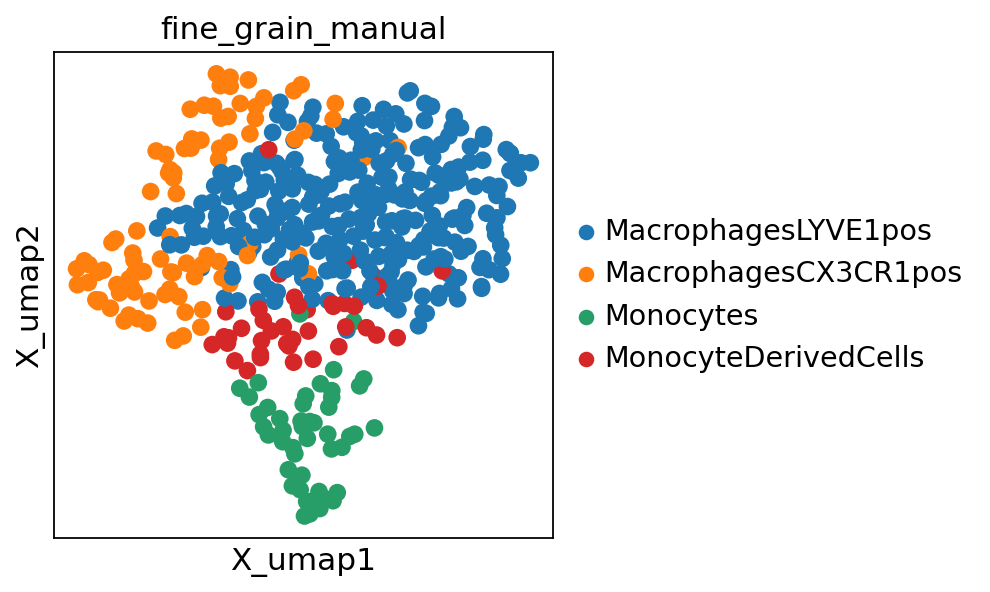

In [72]:
sc.pl.embedding(adata_sub, basis=f"X_umap",
                color='fine_grain_manual',
                wspace=0.3)

categories: MacrophagesLYVE1pos, MacrophagesCX3CR1pos, Monocytes, etc.
var_group_labels: Mono, MP, CX3CR1+, etc.


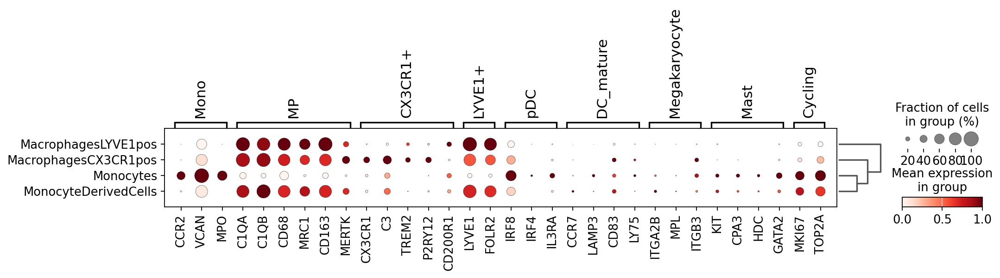

In [73]:
sc.tl.dendrogram(adata_sub,groupby='fine_grain_manual')
sc.pl.dotplot(adata_sub,
              var_names=markers_sel,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

# Transfer annotation to the original adata

In [74]:
adata.obs['fine_grain_manual'] = adata.obs['fine_grain_manual'].astype('str')
adata.obs.loc[adata_sub.obs_names,'fine_grain_manual'] = adata_sub.obs['fine_grain_manual'].astype('str').copy()

... storing 'fine_grain_manual' as categorical


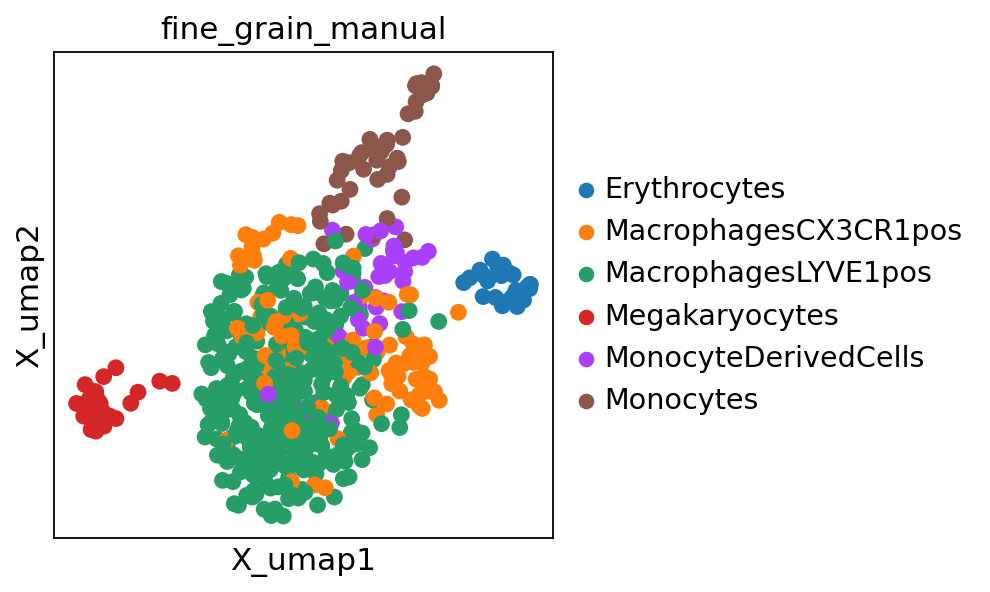

In [75]:
sc.pl.embedding(adata, basis=f"X_umap",
                color='fine_grain_manual'
                )

# Save

In [ ]:
# save
adata.write(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
print(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')